# See Images in datasets

## View different CLAHE modifications per example

The following subscript is used to view the images saved into the dataset image folders modified to be view as it would be used in the main Python script notebook.

In [ ]:
from os import listdir
from os.path import isfile, join

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import random as rand

In [ ]:
def factors(n):
    min_fact, max_fact = 1, n
    for i in range(2, n):
        if (n%i) == 0:
            if (n//i == i): # for square numbers
                return i, i
            if (n//i == max_fact): # new min_fact is old max_fact
                return min_fact, max_fact
            min_fact, max_fact = i, n//i
    return min_fact, max_fact

In [ ]:
default_titles = ['Input Image', 'Input Depth', 'Measured Depth Values', 'True Mask', 'Predicted Mask']

def displayImages(display_list, title=default_titles):
    plt.figure(figsize=(25, 25))
    len_display_list = len(display_list)
    print(len_display_list)
    
    row, col = factors(len_display_list)

    for r in range(row):
        for c in range(col):
            ##i = (col*r+c)
            ##print(type(display_list[i]))
            ##print(f"display - INFO: display_list[{i}].shape = {display_list[i].shape}")
            plt.subplot(row, col, (col*r+c)+1)
            plt.title(title[(col*r+c)])
            plt.imshow(display_list[(col*r+c)])
            plt.axis('off')
    plt.show()

In [ ]:
def obtainImageAndDepths(image_path):
    image = mpimg.imread(image_path)
    depth = mpimg.imread(image_path.replace('left', 'depth'))
    depth_val = mpimg.imread(image_path.replace('left', 'measuredDepth'))
    print(np.min(depth), np.max(depth), np.min(depth_val), np.max(depth_val))
    return image, depth, depth_val

In [ ]:
def obtainImages(image_paths=[]):
    images = []
    for image_path in image_paths:
        image = mpimg.imread(image_path)
        #image = cv2.imread(image_path)
        images.append(image)
        #print(f"{image_path} np.min(image) = {np.min(image)}, np.max(image) = {np.max(image)}")
    return images

In [ ]:
# https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_equalize.html
# https://stackoverflow.com/a/66676709
# https://towardsdatascience.com/clahe-and-thresholding-in-python-3bf690303e40
# https://www.pyimagesearch.com/2021/02/01/opencv-histogram-equalization-and-adaptive-histogram-equalization-clahe/

import cv2
import numpy as np
from matplotlib import pyplot as plt

k = 15 # kernel_size
def colourCorrect(l3_image):
    l3_image = cv2.resize(l3_image, (128, 128))
    
    new_images, labels = [], []
    
    #new_images.append(cv2.cvtColor(l3_image, cv2.COLOR_BGR2RGB))
    #labels.append("Input")
    shape = l3_image.shape
    print(shape)
    
    hsv_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
    
    equ_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
    equ_image[:, :, 2] = cv2.equalizeHist(equ_image[:, :, 2])
    equ_image = cv2.cvtColor(equ_image, cv2.COLOR_HSV2BGR)
    #new_images.append(cv2.cvtColor(equ_image, cv2.COLOR_BGR2RGB))
    #labels.append("Equalised")
    
    for c in range(15, 45, 5):
        c /= 10
        for k in range(2, 8, 1):
            clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize=(k,k)) # c = 2.0
            cl_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
            cl_image[:, :, 2] = clahe.apply(cl_image[:, :, 2])
            cl_image = cv2.cvtColor(cl_image, cv2.COLOR_HSV2BGR)
            new_images.append(cv2.cvtColor(cl_image, cv2.COLOR_BGR2RGB))
            labels.append(f"CLAHE_{c}_{k}")
    
    
    #ret_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
    #ret_image[:, :, 2], _ = cv2.threshold(cl_image[:, :, 2], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    #ret_image = cv2.cvtColor(ret_image, cv2.COLOR_HSV2BGR)
    #new_images.append(cv2.cvtColor(ret_image, cv2.COLOR_BGR2RGB))
    
    
    return new_images, labels

In [ ]:
import cv2

def convertPlt2OpenCV(rgb_image):
    return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2BGR)

def equHistImage(l3_image):
    hsv_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
    hsv_image[:, :, 2] = cv2.equalizeHist(hsv_image[:, :, 2])
    equ_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
    return equ_image

def claheImage(l3_image, k=15): # k == kernel_size
    clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(k,k))
    
    hsv_image = cv2.cvtColor(l3_image, cv2.COLOR_BGR2HSV)
    hsv_image[:, :, 2] = clahe.apply(hsv_image[:, :, 2])
    cl_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
    return cl_image

def convertOpenCV2Plt(bgr_image):
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(rgb_image)
    return img

Which folder's images should shown?
data_sealed_road or data_unsealed_road
data_sealed_pothole or data_unsealed_pothole
data_sealed_pothole_modified or data_unsealed_pothole_modified
Folder: data_unsealed_pothole
(128, 128, 3)
36


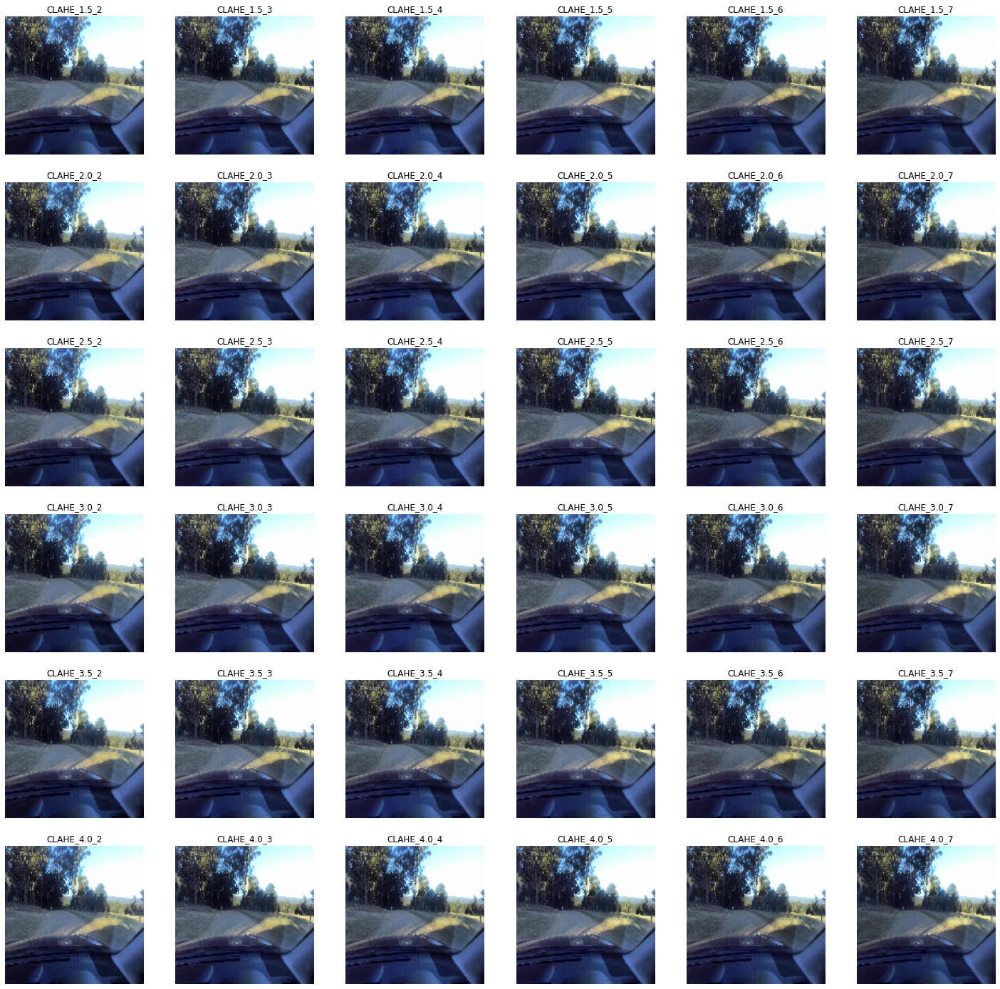

(128, 128, 3)
36


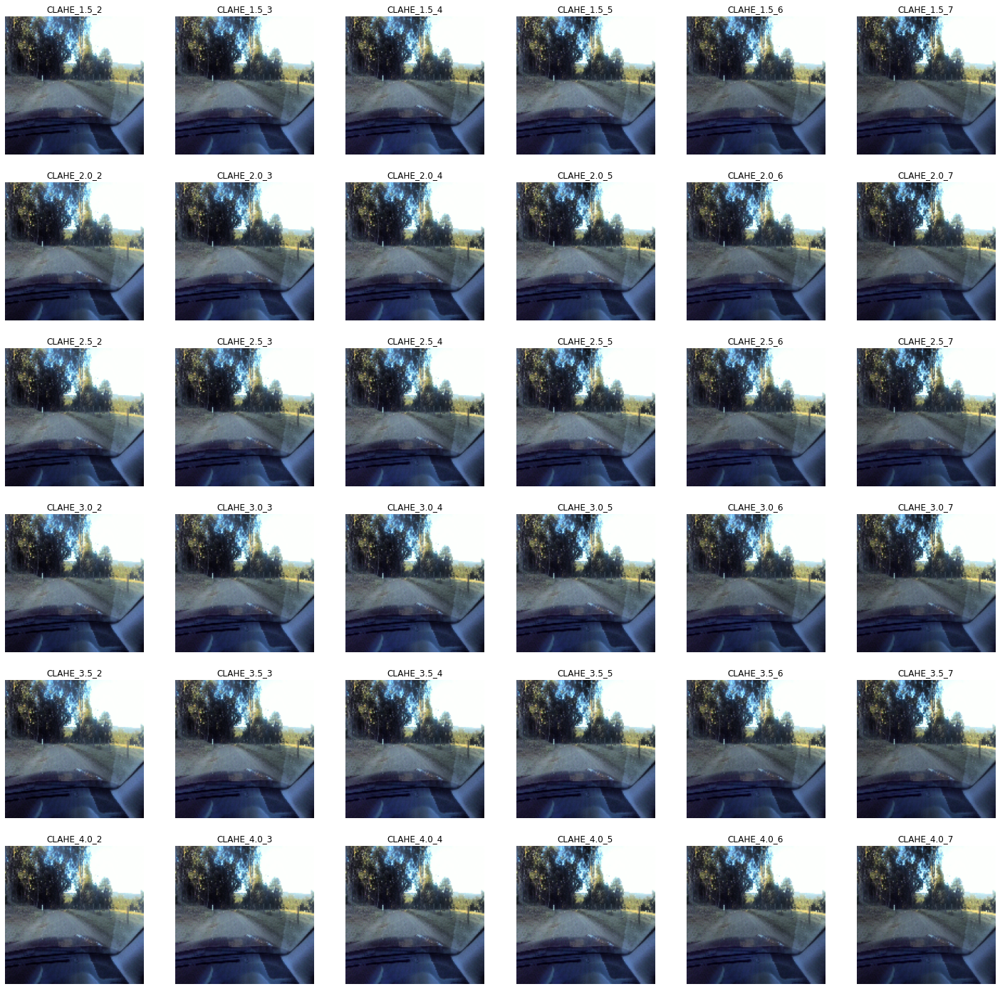

(128, 128, 3)
36


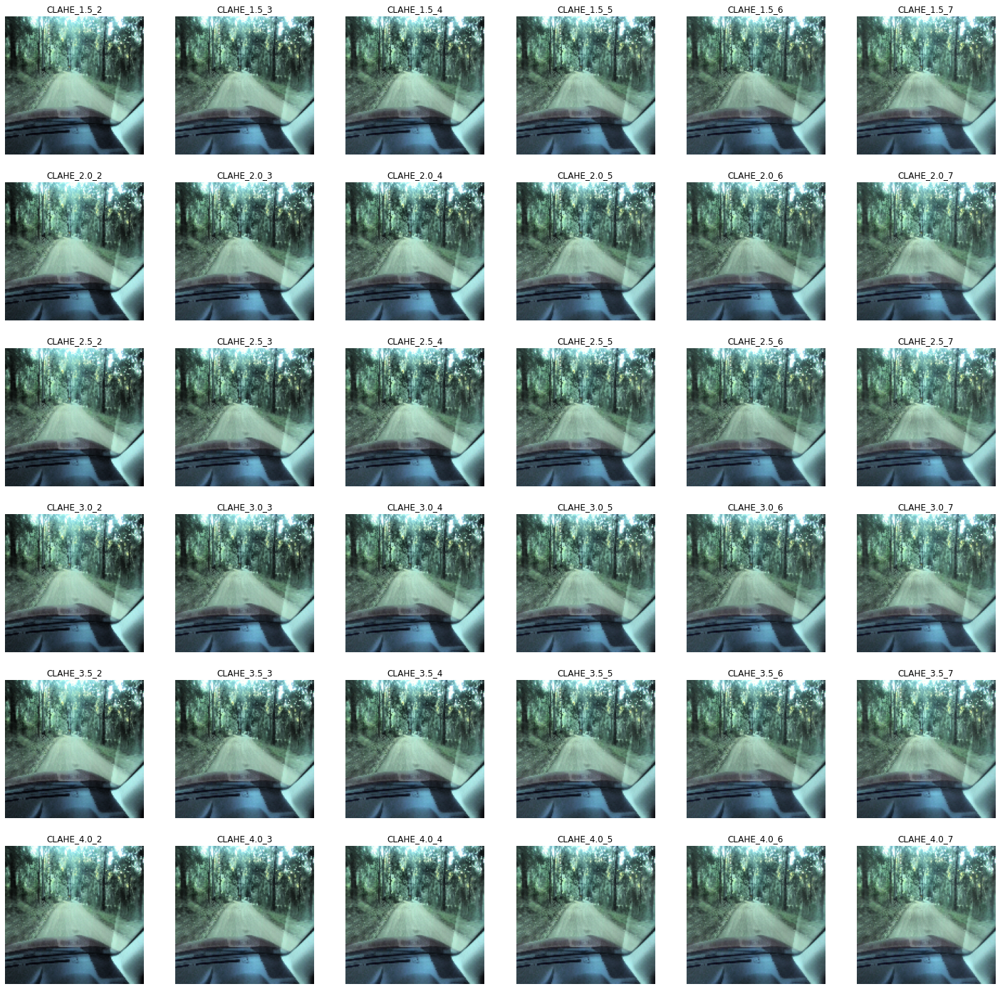

(128, 128, 3)
36


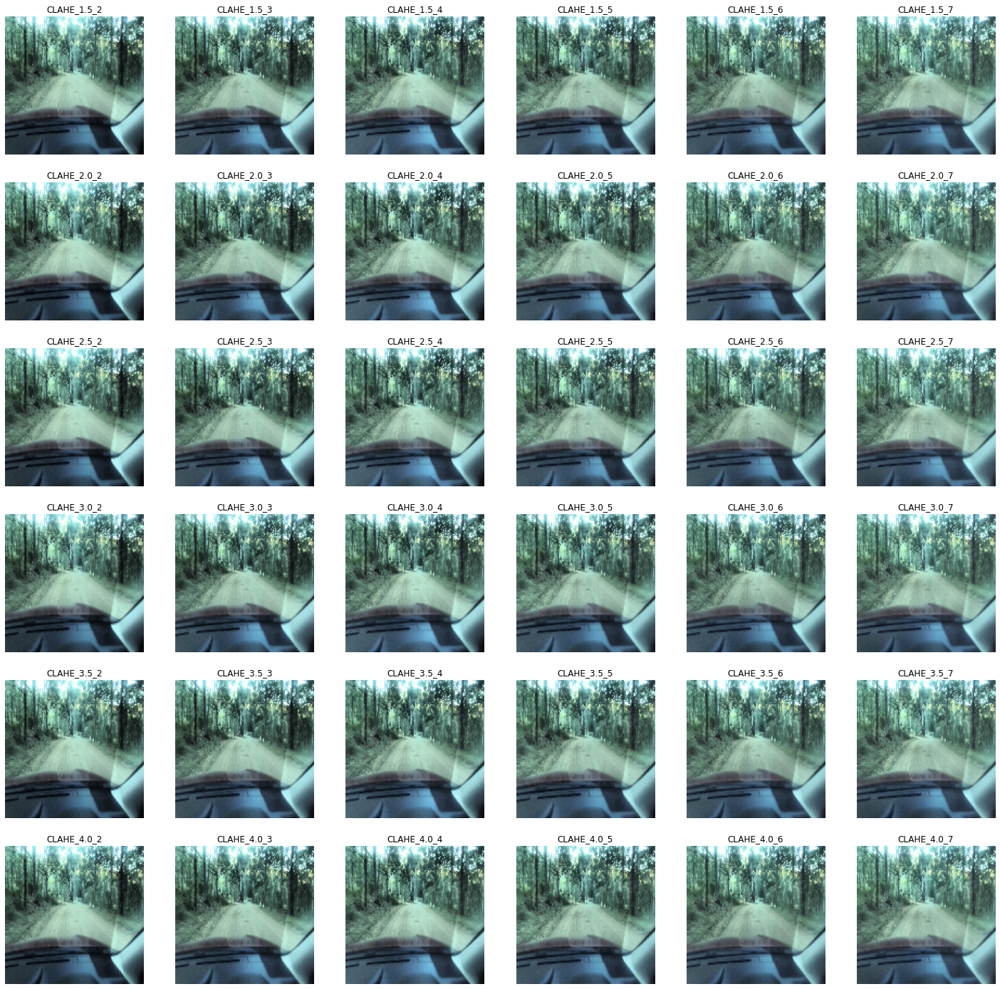

(128, 128, 3)
36


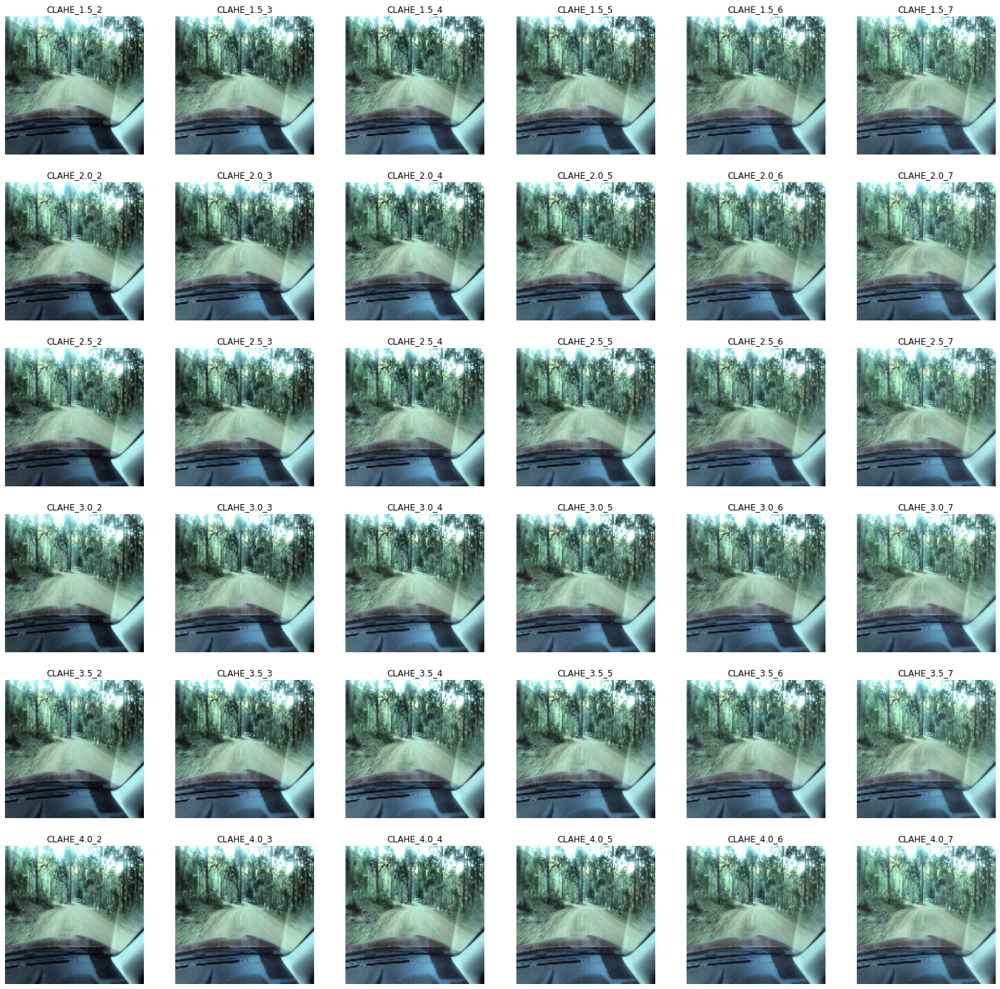

In [135]:
print("Which folder's images should shown?")
print("data_sealed_road or data_unsealed_road")
print("data_sealed_pothole or data_unsealed_pothole")
print("data_sealed_pothole_modified or data_unsealed_pothole_modified")
source_folder_path = input("Folder: ")

folder_path = join(source_folder_path, "images")

item_names = listdir(folder_path)
item_names.sort()

for item_name in item_names[:5]:
    image_path = join(join(source_folder_path, "images"), item_name)
    bgr_image = cv2.imread(image_path)
    #displayImages([bgr_image], ["Input"])

    images, labels = colourCorrect(bgr_image)
    ##print(len(images), labels)
    displayImages(images, labels)
    #displayImages(images, ["Input", "Equalised", "CLAHE", "OTSU"])

In [1]:
ERROR ME!

SyntaxError: invalid syntax (2297258513.py, line 1)

## View image modification per example

The following subscript is used to view the images saved into the dataset image folders modified with different colour correction methods.

In [ ]:
print("Which folder's images should shown?")
print("data_sealed_road or data_unsealed_road")
print("data_sealed_pothole or data_unsealed_pothole")
print("data_sealed_pothole_modified or data_unsealed_pothole_modified")
source_folder_path = input("Folder: ")

folder_path = join(source_folder_path, "images")

item_names = listdir(folder_path)
item_names.sort()

# print(item_names)

for item_name in item_names:
    image_paths = [
        join(join(source_folder_path, "images"), item_name),
        join(join(source_folder_path, "depths"), item_name.replace('-left', '-depth')),
        join(join(source_folder_path, "ground"), item_name.replace('-left', '-ground')),
    ]
#     print(image_paths)
    images = obtainImages(image_paths)
    images = colourCorrect(images)
    #displayImages(images, ["Input Image", "Input Depth", "Input Ground"])
    displayImages(images, ["Input", "Equalised", "CLAHE", "OTSU"])

In [2]:
ERROR ME!

SyntaxError: invalid syntax (2297258513.py, line 1)

# Modification using CLAHE to dataset examples



The following subscript was a trial to determine how to integrate the usage of CLAHE as a preprocessing of the data before usage for the main Python script notebook.

In [ ]:
DEBUG = False
DEBUG_WARN = True
DEBUG_INFO = True

def debug(s):
    if not DEBUG:
        return
    
    if DEBUG_WARN and "WARN" in s:
        print(s)
    if DEBUG_INFO and "INFO" in s:
        print(s)

In [ ]:
try:
    import tf_clahe
except:
    !pip install tf_clahe
    import tf_clahe

In [ ]:
DATA_TYPE = True

In [ ]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing
import tensorflow_datasets as tfds

In [ ]:
dataset, info = tfds.load('wallaby_combined_pothole:1.*.*', with_info=True)

In [ ]:
def normalize(inputs):
    len_inputs = len(inputs)
    for i in range(len_inputs-1):
        inputs[i] = tf.cast(inputs[i], tf.float32) / 255.0
    
    inputs[-1] = tf.keras.backend.clip(inputs[-1], 0, 1)
    inputs[-1] = tf.cast(inputs[-1], tf.float32)
    return inputs

In [ ]:
def load_image(datapoint):
    debug(f"load_image - WARN: type(datapoint) = {type(datapoint)}")
    debug(f"load_image - WARN: dict(datapoint) = {dict(datapoint)}")
    
    input_image = tf.image.resize(datapoint['image'], (128, 128))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))
    
    if CLAHE:
        input_image = tf_clahe.clahe(input_image, tile_grid_size=(2, 2), clip_limit=2.0)
    
    if DATA_TYPE:
        input_depth = tf.image.resize(datapoint['depth'], (128, 128))
        input_image, input_depth, input_mask =  normalize([input_image, input_depth, input_mask])
        return (input_image, input_depth), input_mask

    input_image, input_mask = normalize([input_image, input_mask])
    return input_image, input_mask

In [ ]:
def displayImages(display_list, use_depth=False):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']
    if use_depth:
        title = ['Input Image', 'Input Depth', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        debug(f"displayImages - INFO: type(display_list[i]) = {type(display_list[i])}")
        debug(f"displayImages - INFO: display_list[{i}].shape = {display_list[i].shape}")
        
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [ ]:
def displayNDataset(dataset, n=1, use_depth=False):
    for images, masks in dataset.take(n):
        sample_mask = masks[0]
        
        if use_depth:
            sample_image = images[0][0]
            sample_depth = images[1][0]
            displayImages([sample_image, sample_depth, sample_mask], use_depth=use_depth)
            continue

        sample_image = images[0]
        displayImages([sample_image, sample_mask], use_depth=use_depth)

In [ ]:
class Normalise(tf.keras.layers.Layer):
    def __init__(self, use_depth=False):
        super().__init__()
        self.use_depth = use_depth
        self.norm_images = preprocessing.Normalization()
        self.norm_depths = preprocessing.Normalization()
        self.norm_labels = preprocessing.Normalization()

    def call(self, inputs, labels):
        labels = self.norm_labels(labels)
        
        #if DATA_TYPE:
        if self.use_depth:
            images = inputs[0]
            depths = inputs[1]
            images = self.norm_images(images)
            depths = self.norm_depths(depths)
            return (images, depths), labels
        
        inputs = self.norm_images(inputs)
        return inputs, labels

In [ ]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 2 # ORIGINALLY 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [ ]:
CLAHE = False
train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
train_batches = (
    train_images
    .batch(BATCH_SIZE)
    .map(Normalise(use_depth=DATA_TYPE))
    .prefetch(buffer_size=tf.data.AUTOTUNE))
test_batches = (
    test_images
    .batch(BATCH_SIZE)
    .map(Normalise(use_depth=DATA_TYPE))
    .prefetch(buffer_size=tf.data.AUTOTUNE))

In [ ]:
displayNDataset(train_batches, 4, use_depth=DATA_TYPE)

In [ ]:
displayNDataset(test_batches, 4, use_depth=DATA_TYPE)

In [ ]:
CLAHE = True
train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
train_batches = (
    train_images
    .batch(BATCH_SIZE)
    .map(Normalise(use_depth=DATA_TYPE))
    .prefetch(buffer_size=tf.data.AUTOTUNE))
test_batches = (
    test_images
    .batch(BATCH_SIZE)
    .map(Normalise(use_depth=DATA_TYPE))
    .prefetch(buffer_size=tf.data.AUTOTUNE))

In [ ]:
displayNDataset(train_batches, 4, use_depth=DATA_TYPE)

In [ ]:
displayNDataset(test_batches, 4, use_depth=DATA_TYPE)